# Отток клиентов

Входные данные - исторические данные о поведении клиентов банка и расторжении договоров с банком. 

Задача - построить модель, прогнозирующую, уйдёт клиент из банка в ближайшее время или нет. Достичь *F1*-меры не меньше 0.59. Дополнительно измерять *AUC-ROC*, сравнивать её значение с *F1*-мерой.

Источник данных: [https://www.kaggle.com/barelydedicated/bank-customer-churn-modeling](https://www.kaggle.com/barelydedicated/bank-customer-churn-modeling)

# Оглавление

* [1. Подготовка данных](#1.-Подготовка-данных)
    * [Выводы (шаг 1)](#Выводы-(шаг-1))
* [2. Исследование задачи](#2.-Исследование-задачи)
    * [Выводы (шаг 2)](#Выводы-(шаг-2))
* [3. Борьба с дисбалансом](#3.-Борьба-с-дисбалансом)
    * [Взвешивание классов](#Взвешивание-классов)
    * [Upsampling](#Upsampling)
    * [Downsampling](#Downsampling)
    * [Сравнение моделей](#Сравнение-моделей)
    * [Изменение порога](#Изменение-порога)
    * [Выводы (шаг 3)](#Выводы-(шаг-3))
* [4. Тестирование модели](#4.-Тестирование-модели)
    * [Выводы (шаг 4)](#Выводы-(шаг-4))

# 1. Подготовка данных

## Первичная оценка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
data_yandex = pd.read_csv('Churn.csv')

In [3]:
data = pd.read_csv('Churn_Modelling.csv')

In [4]:
data_yandex.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           9091 non-null   float64
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 1.1+ MB


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [6]:
data_yandex.describe()

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.00000,1.000000e+04,10000.000000,10000.000000,9091.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,5000.50000,1.569094e+07,650.528800,38.921800,4.997690,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,2886.89568,7.193619e+04,96.653299,10.487806,2.894723,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.00000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,2500.75000,1.562853e+07,584.000000,32.000000,2.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,5000.50000,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,7500.25000,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,10000.00000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [7]:
data.describe()

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.00000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,5000.50000,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,2886.89568,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.00000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,2500.75000,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,5000.50000,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,7500.25000,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,10000.00000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [8]:
data.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


## Удаление столбцов, которые не несут информации

In [9]:
# Duplicates check
data.query('CustomerId.duplicated() == True')

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited


In [10]:
data = data.drop(columns=['RowNumber', 'CustomerId', 'Surname'])

data.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


## Изменение названий столбцов на более удобные

In [11]:
data.columns = ['credit_score', 'geography', 'gender', 'age', 'tenure', 'balance', 'products_num', 'has_cr_card', 'is_active_member', 'estimated_salary', 'exited']

data.columns

Index(['credit_score', 'geography', 'gender', 'age', 'tenure', 'balance',
       'products_num', 'has_cr_card', 'is_active_member', 'estimated_salary',
       'exited'],
      dtype='object')

## Проверка остальных столбцов

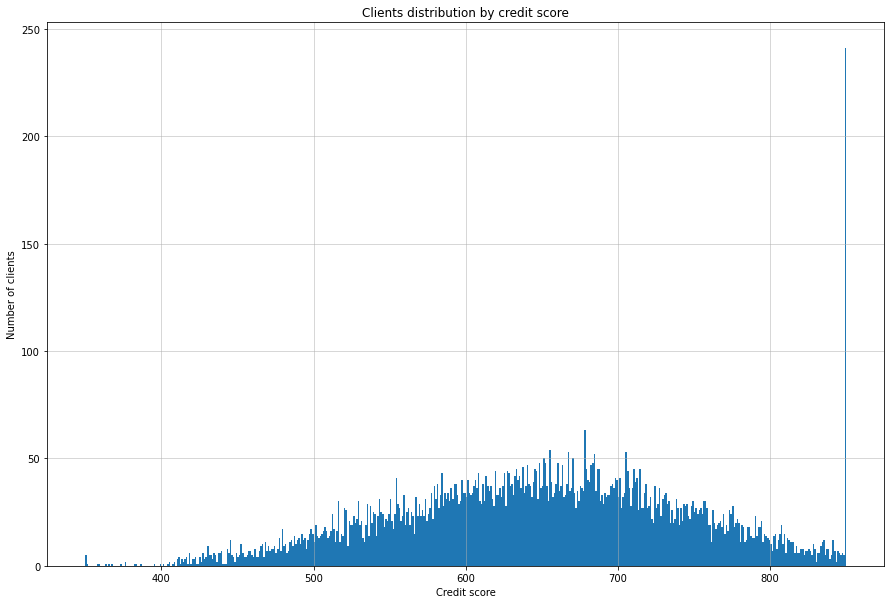

In [12]:
data['credit_score'].hist(bins=500, figsize=(15, 10))
plt.xlabel('Credit score')
plt.ylabel('Number of clients')
plt.grid(linewidth=0.5)
plt.title('Clients distribution by credit score')
plt.show()

In [13]:
# Visual assessment of clients with a credit rating of 850
print('Amount of clients with credit score equal to 850 - {} ({:.2%})'.format(len(data.query('credit_score == 850')), len(data.query('credit_score == 850')) / len(data)))

data.query('credit_score == 850')

Amount of clients with credit score equal to 850 - 233 (2.33%)


,credit_score,geography,gender,age,tenure,balance,products_num,has_cr_card,is_active_member,estimated_salary,exited
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
38,850,France,Male,36,7,0.00,1,1,1,40812.90,0
180,850,Spain,Female,45,2,122311.21,1,1,1,19482.50,0
200,850,Spain,Male,30,2,141040.01,1,1,1,5978.20,0
223,850,France,Male,33,10,0.00,1,1,0,4861.72,1
...,...,...,...,...,...,...,...,...,...,...,...
9581,850,France,Female,28,9,0.00,2,1,1,164864.67,0
9646,850,Spain,Male,71,10,69608.14,1,1,0,97893.40,1
9688,850,France,Male,68,5,169445.40,1,1,1,186335.07,0
9931,850,France,Female,34,6,101266.51,1,1,0,33501.98,0


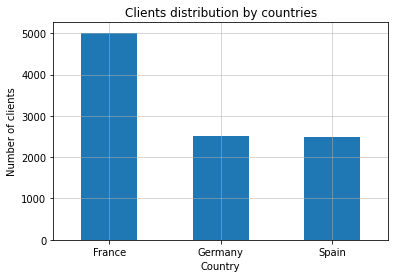

In [14]:
data['geography'].value_counts().plot(kind='bar')
plt.xlabel('Country')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.5)
plt.title('Clients distribution by countries')
plt.show()

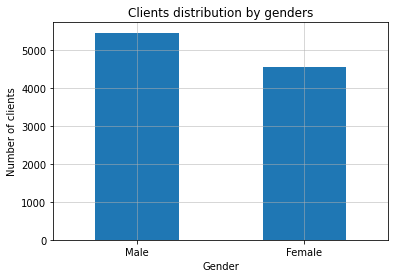

In [15]:
data['gender'].value_counts().plot(kind='bar')
plt.xlabel('Gender')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.5)
plt.title('Clients distribution by genders')
plt.show()

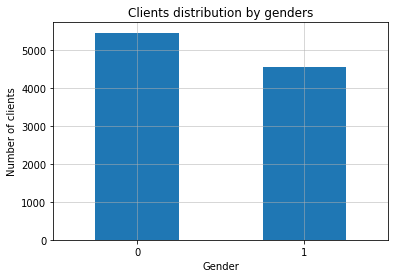

In [16]:
data['gender'] = data['gender'].map({'Male': 0,'Female': 1}).astype('int')

data['gender'].value_counts().plot(kind='bar')
plt.xlabel('Gender')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.5)
plt.title('Clients distribution by genders')
plt.show()

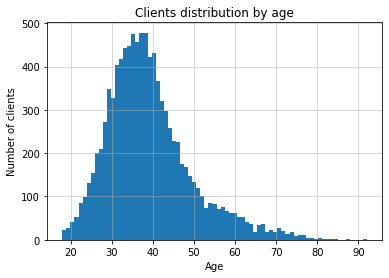

In [17]:
data['age'].hist(bins=75)
plt.xlabel('Age')
plt.ylabel('Number of clients')
plt.grid(linewidth=0.5)
plt.title('Clients distribution by age')
plt.show()

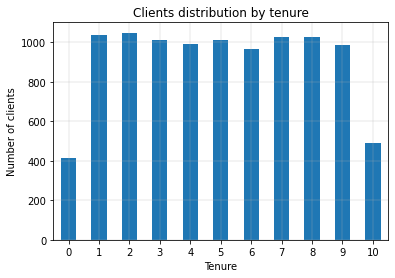

In [18]:
data['tenure'].value_counts(dropna=False).sort_index().plot(kind='bar')
plt.xlabel('Tenure')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.3)
plt.title('Clients distribution by tenure')
plt.show()

In [19]:
data_yandex.query('Tenure.isnull()')

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
30,31,15589475,Azikiwe,591,Spain,Female,39,NaN,0.00,3,1,0,140469.38,1
48,49,15766205,Yin,550,Germany,Male,38,NaN,103391.38,1,0,1,90878.13,0
51,52,15768193,Trevisani,585,Germany,Male,36,NaN,146050.97,2,0,0,86424.57,0
53,54,15702298,Parkhill,655,Germany,Male,41,NaN,125561.97,1,0,0,164040.94,1
60,61,15651280,Hunter,742,Germany,Male,35,NaN,136857.00,1,0,0,84509.57,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9944,9945,15703923,Cameron,744,Germany,Male,41,NaN,190409.34,2,1,1,138361.48,0
9956,9957,15707861,Nucci,520,France,Female,46,NaN,85216.61,1,1,0,117369.52,1
9964,9965,15642785,Douglas,479,France,Male,34,NaN,117593.48,2,0,0,113308.29,0
9985,9986,15586914,Nepean,659,France,Male,36,NaN,123841.49,2,1,0,96833.00,0


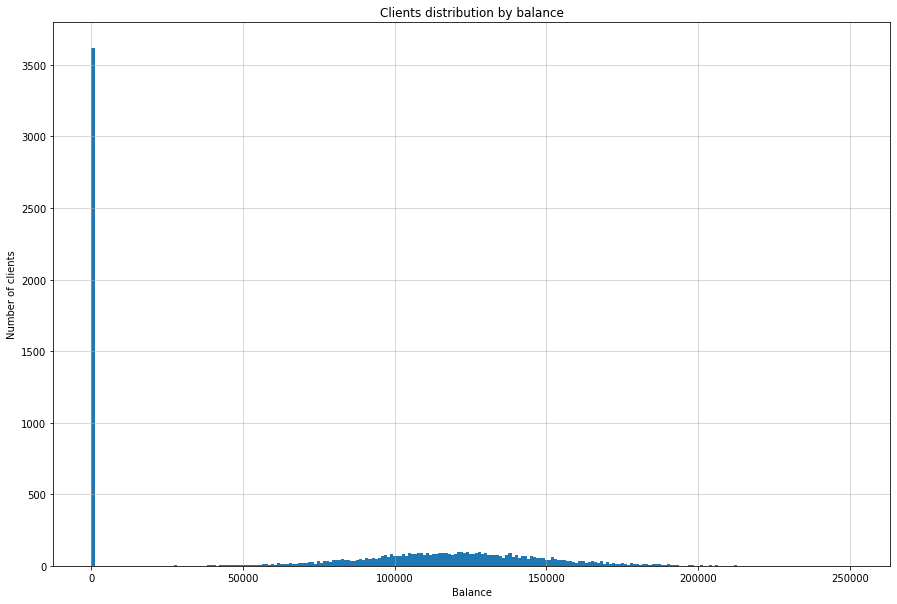

In [20]:
data['balance'].hist(bins=250, figsize=(15, 10))
plt.xlabel('Balance')
plt.ylabel('Number of clients')
plt.grid(linewidth=0.5)
plt.title('Clients distribution by balance')
plt.show()

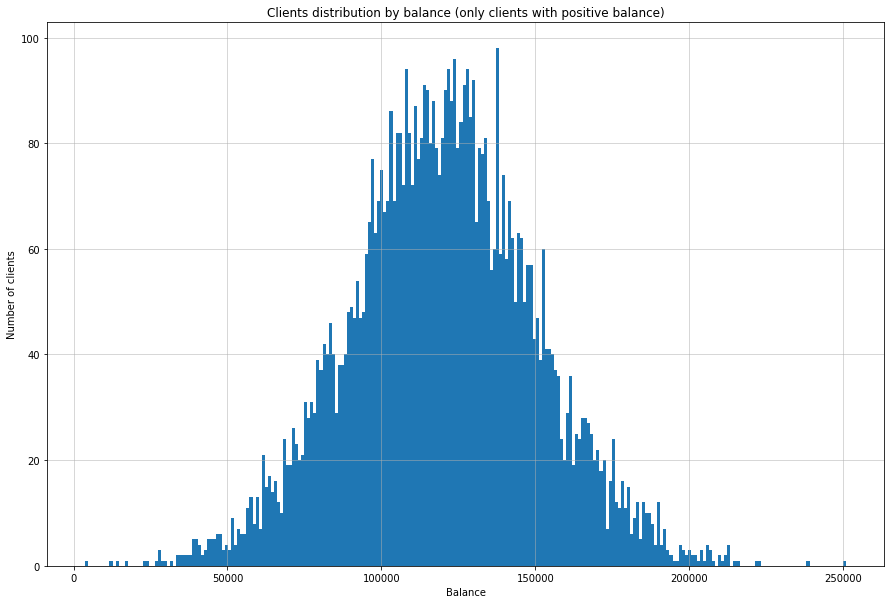

In [21]:
data.query('balance > 0')['balance'].hist(bins=250, figsize=(15, 10))
plt.xlabel('Balance')
plt.ylabel('Number of clients')
plt.grid(linewidth=0.5)
plt.title('Clients distribution by balance (only clients with positive balance)')
plt.show()

In [22]:
print('Amount of clients with zero balance - {} ({:.2%})'.format(len(data.query('balance == 0')), len(data.query('balance == 0')) / len(data)))

Amount of clients with zero balance - 3617 (36.17%)


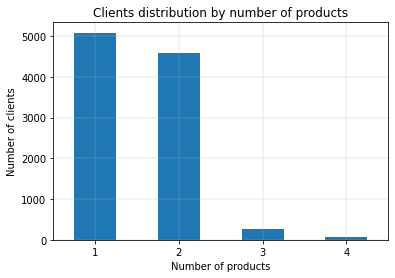

In [23]:
data['products_num'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Number of products')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.3)
plt.title('Clients distribution by number of products')
plt.show()

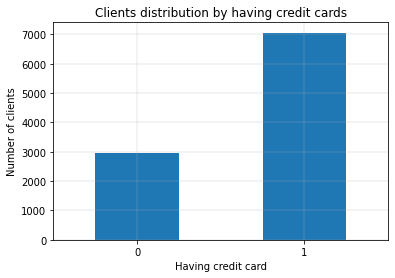

In [24]:
data['has_cr_card'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Having credit card')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.3)
plt.title('Clients distribution by having credit cards')
plt.show()

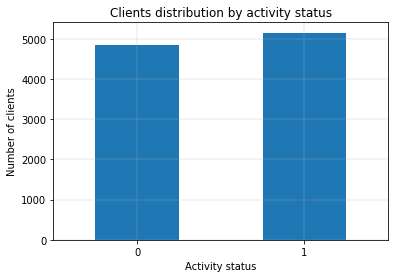

In [25]:
data['is_active_member'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Activity status')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.3)
plt.title('Clients distribution by activity status')
plt.show()

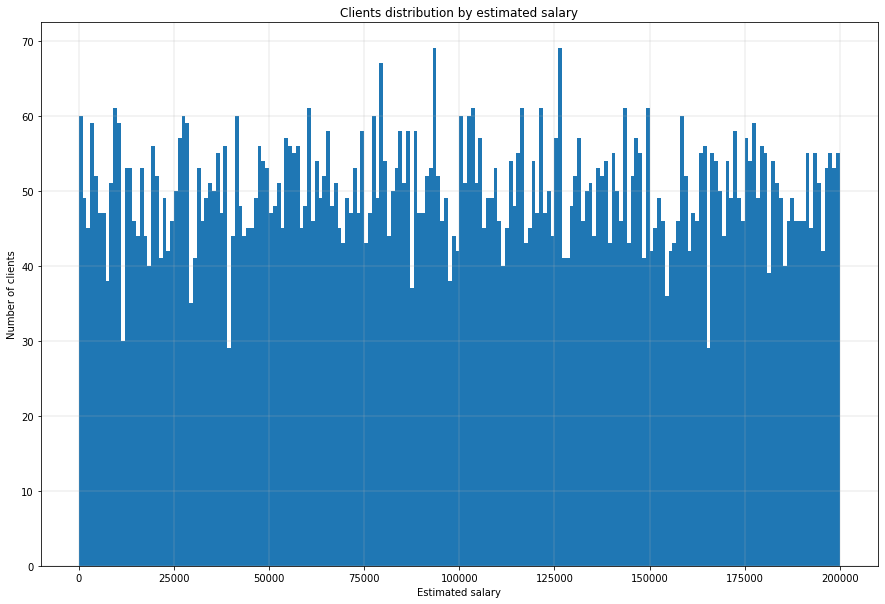

In [26]:
data['estimated_salary'].hist(bins=200, figsize=(15, 10))
plt.xlabel('Estimated salary')
plt.ylabel('Number of clients')
plt.grid(linewidth=0.3)
plt.title('Clients distribution by estimated salary')
plt.show()

## Geography one-hot encoding

In [27]:
data = pd.get_dummies(data, drop_first=True)

data.head()

,credit_score,gender,age,tenure,balance,products_num,has_cr_card,is_active_member,estimated_salary,exited,geography_Germany,geography_Spain
0,619,1,42,2,0.00,1,1,1,101348.88,1,0,0
1,608,1,41,1,83807.86,1,0,1,112542.58,0,0,1
2,502,1,42,8,159660.80,3,1,0,113931.57,1,0,0
3,699,1,39,1,0.00,2,0,0,93826.63,0,0,0
4,850,1,43,2,125510.82,1,1,1,79084.10,0,0,1


## Масштабирование признаков

In [28]:
from sklearn.preprocessing import StandardScaler

In [29]:
# Defining columns to scale
columns_to_scale = ['credit_score', 'age', 'tenure', 'balance', 'products_num', 'estimated_salary']

In [30]:
# Columns scaling
data.loc[:, columns_to_scale] = StandardScaler().fit_transform(data.loc[:, columns_to_scale])

data.head()

,credit_score,gender,age,tenure,balance,products_num,has_cr_card,is_active_member,estimated_salary,exited,geography_Germany,geography_Spain
0,-0.326221,1,0.293517,-1.041760,-1.225848,-0.911583,1,1,0.021886,1,0,0
1,-0.440036,1,0.198164,-1.387538,0.117350,-0.911583,0,1,0.216534,0,0,1
2,-1.536794,1,0.293517,1.032908,1.333053,2.527057,1,0,0.240687,1,0,0
3,0.501521,1,0.007457,-1.387538,-1.225848,0.807737,0,0,-0.108918,0,0,0
4,2.063884,1,0.388871,-1.041760,0.785728,-0.911583,1,1,-0.365276,0,0,1


## Разделение данных на обучающую, валидационную и тестовую выборки

In [31]:
from sklearn.model_selection import train_test_split

In [32]:
# Separation of data into features and target feature
features = data.drop(columns=['exited'])
target = data['exited']

In [33]:
# Separation of data to train sample and combined validation + test samples
X_train, X_valid, y_train, y_valid = train_test_split(features, target, train_size=0.6, random_state=42)

# Separation of combined valid + test sample to validation and test samples
X_valid, X_test, y_valid, y_test = train_test_split(X_valid, y_valid, train_size=0.5, random_state=42)

In [36]:
# Data check
X_train.shape

(6000, 11)

## Выводы (шаг 1)

Файл с данными состоит из 14 столбцов (8 целочисленных, 3 с плавающей точкой и 3 с объектами) и 10000 записей. В столбце __Exited__ содержится целевой признак.

Столбцы __RowNumber__, __CustomerId__ и __Surname__ были сразу отброшены, так как не несут никакой значимой информации для предсказания оттока клиентов.

Названия оставшихся столбцов были приведены к нижнему регистру. Название части столбцов были несколько изменены для удобства использования:
- creditscore -> credit_score
- numofproducts -> products_num
- hascrcard -> has_cr_card
- isactivemember -> is_active_member
- estimatedsalary -> estimated_salary

Остальные столбцы были проверены на выбросы и аномалии. В большинстве столбцов таких не оказалось, кроме столбцов:
- __credit_score__, где имеется значительный выброс (233 клиента (2.33% выборки)) в максимальном значении, равном 850. Это значение в принципе является максимум для кредитного рейтинга и, видимо, есть часть клиентов, которые могли бы претендовать на рейтинг больший, если бы не ограничение. Поэтому данная аномалия не подлежит удалению;
- __tunure__, где были обнаружено значительное количество пропусков (около 9% данных). Мною был проверен оригинал датасета на Kaggle. Оказалось, что данные при выкачивании дата инженером Яндекса были частично утрачены - на Kaggle пропуски отсутствуют (в остальном данные идентичны). Вполне рабочий кейс - моделируют ситуацию обращения к дата инженеру с последующим исправлением ошибок при выгрузке данных;
- __balance__, где 3617 (36.17%) клиентов имеют нулевой баланс. Это можно объяснить тем, что далеко не все клиенты всегда хранят деньги в банки, а кто-то может использовать счет, например, как зарплатный и снимать с него деньги сразу после получения.

Категориальный признак __geography__ был преобразован в численный с помощью метода прямого кодирования. Все численные признаки были отмасштабированы с помощью метода стандартизации данных так как многие из них имеют значительное различие в порядках значений.

Данные разделены на обучающую, валидационную и тестовую выборки в соотношении 3:1:1.

# 2. Исследование задачи

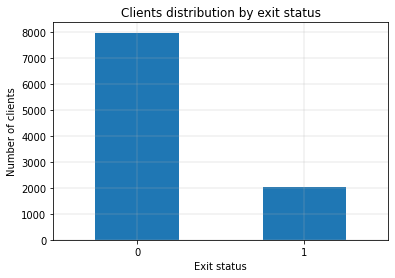

In [37]:
data['exited'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Exit status')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.3)
plt.title('Clients distribution by exit status')
plt.show()

In [38]:
from sklearn.metrics import f1_score, roc_auc_score

import time

import plotly.graph_objects as go

In [102]:
# Function for parameters optimization process visualization
# data - (DataFrame) Data with tested parameters and results
# model_type - (string) type of model - dt/rf for decision tree/random forest
# balancing_type - (string) balancing method for graph title
def parameters_graph(data, model_type, balancing_type=''):
    fig = go.Figure()
    
    # markers hover
    if model_type == 'dt':
        hover_f1 = "F1: %{customdata[0]:.4f}<br>AUC-ROC: %{customdata[1]:.4f}<br>max_depth: %{customdata[2]}<br>min_samples_split: %{customdata[3]}<br>min_samples_leaf: %{customdata[4]}"
        hover_auc = "AUC-ROC: %{customdata[1]:.4f}<br>F1: %{customdata[0]:.4f}<br>max_depth: %{customdata[2]}<br>min_samples_split: %{customdata[3]}<br>min_samples_leaf: %{customdata[4]}"
    else:
        hover_f1 = "F1: %{customdata[0]:.4f}<br>AUC-ROC: %{customdata[1]:.4f}<br>n_estimators: %{customdata[2]}<br>max_depth: %{customdata[3]}<br>min_samples_split: %{customdata[4]}<br>min_samples_leaf: %{customdata[5]}"
        hover_auc = "AUC-ROC: %{customdata[1]:.4f}<br>F1: %{customdata[0]:.4f}<br>n_estimators: %{customdata[2]}<br>max_depth: %{customdata[3]}<br>min_samples_split: %{customdata[4]}<br>min_samples_leaf: %{customdata[5]}"
    
    # F1 metric line
    fig.add_trace(go.Scatter(
        y=data['f1'], 
        mode='lines',
        name='F1',
        customdata=data,
        hovertemplate = hover_f1,
        line=dict(width=1)
    ))
    
    # AUC-ROC metric line
    fig.add_trace(go.Scatter(
        y=data['auc_roc'], 
        mode='lines',
        name='AUC-ROC',
        customdata=data,
        hovertemplate = hover_auc,
        line=dict(width=1)
    ))
    
    # Best not overfitted F1 value
    fig.add_trace(go.Scatter(
        x=[data.query('overfitted == False')['f1'].idxmax()],
        y=[data.query('overfitted == False')['f1'].max()], 
        mode='markers',
        name='F1 max',
        customdata=[data.query('overfitted == False').loc[data.query('overfitted == False')['f1'].idxmax()]],
        hovertemplate = hover_f1
    ))
    
    # Best not overfitted AUC-ROC value
    fig.add_trace(go.Scatter(
        x=[data.query('overfitted == False')['auc_roc'].idxmax()],
        y=[data.query('overfitted == False')['auc_roc'].max()], 
        mode='markers',
        name='AUC-ROC max',
        customdata=[data.query('overfitted == False').loc[data.query('overfitted == False')['auc_roc'].idxmax()]],
        hovertemplate = hover_auc
    ))

    fig.update_traces(
        marker=dict(size=6)
    )
    
    if model_type == 'dt':
        model_name = 'decision tree'
    else:
        model_name = 'random forest'  
    
    # Title and axes names
    fig.update_layout(
        title="Metrics values visualization for " + model_name + " " + balancing_type,
        xaxis_title="Iterations",
        yaxis_title="Metrics values",
        font=dict(
            family="Helvetica",
            size=15,
        )
    )
    
    fig.update_yaxes(range=[0, 1.05])

    fig.show()

## Логистическая регрессия

In [39]:
from sklearn.linear_model import LogisticRegression

In [46]:
start_time = time.time()

# Model hyperparameters setup
model_logreg = LogisticRegression(random_state=42)

# Model training
model_logreg.fit(X_train, y_train)

# Model validation
predict_valid = model_logreg.predict(X_valid)
probabilities_valid = model_logreg.predict_proba(X_valid)
probabilities_one_valid = probabilities_valid[:, 1]

# Calcation of model F1 and AUC-ROC with the validation sample
f1 = f1_score(y_valid, predict_valid)
auc_roc = roc_auc_score(y_valid, probabilities_one_valid)

print('F1 = {:.4}, AUC-ROC = {:.4}'.format(f1, auc_roc))

# Overfitting test
if f1 < f1_score(y_train, model_logreg.predict(X_train)) - 0.1:
    print('Model overfitted')

# Variable to save stats to visualize them
stats_lg = [f1, auc_roc]

print("Whole best model finding time - {:.5} s".format(time.time() - start_time))

F1 = 0.2929, AUC-ROC = 0.7518
Whole best model finding time - 0.057549 s


0.325105358217941

## Дерево решений

In [43]:
from sklearn.tree import DecisionTreeClassifier

In [107]:
start_time = time.time()

max_f1 = -1

# DataFrame to save stats to visualize them
stats_dt = pd.DataFrame(columns=['f1', 'auc_roc', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'overfitted'])

# Model hyperparameters variation
for i in range(4, 12):
    for j in range(2, 203, 10):
        for k in range(1, 36):
            # Model hyperparameters setup
            if i == 11:
                # Replacement max_depth = 0 with None
                model_decisiontree = DecisionTreeClassifier(random_state=42, max_depth=None, min_samples_split=j, min_samples_leaf=k)
            else:
                model_decisiontree = DecisionTreeClassifier(random_state=42, max_depth=i, min_samples_split=j, min_samples_leaf=k)
            
            # Model training
            model_decisiontree.fit(X_train, y_train)
            
            # Model validation
            predict_valid = model_decisiontree.predict(X_valid)
            probabilities_valid = model_decisiontree.predict_proba(X_valid)
            probabilities_one_valid = probabilities_valid[:, 1]
            
            # Calcation of model F1 and AUC-ROC with the validation sample
            f1 = f1_score(y_valid, predict_valid)
            auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
            
            # Overfitting test
            overfitted = f1 < f1_score(y_train, model_decisiontree.predict(X_train)) - 0.1
            
            # Finding best (by F1) model 
            if f1 > max_f1 and not overfitted:
                max_f1 = f1
                
                if i == 11:
                    max_i = None
                else:
                    max_i = i
                
                print(
                    'Maximum F1 = {:.4f} (AUC-ROC = {:.4f}) with max_depth = {}, min_samples_split = {}, min_samples_leaf = {}, time - {:.5} s'
                    .format(max_f1, auc_roc, max_i, j, k, time.time() - start_time)
                )
            
            # Stats save
            stats_dt = stats_dt.append({'f1': f1, 'auc_roc': auc_roc, 'max_depth': i, 'min_samples_split': j, 'min_samples_leaf': k, 'overfitted': overfitted}, ignore_index=True)

# max_depth values correction
stats_dt.loc[stats_dt['max_depth'] == 11, 'max_depth'] = 'None'

print('Whole best model finding time - {:.5} s'.format(time.time() - start_time))

Maximum F1 = 0.4719 (AUC-ROC = 0.7866) with max_depth = 4, min_samples_split = 2, min_samples_leaf = 1, time - 0.042802 s
Maximum F1 = 0.4765 (AUC-ROC = 0.7914) with max_depth = 4, min_samples_split = 2, min_samples_leaf = 3, time - 0.10238 s
Maximum F1 = 0.4865 (AUC-ROC = 0.8021) with max_depth = 4, min_samples_split = 2, min_samples_leaf = 4, time - 0.12925 s
Maximum F1 = 0.4875 (AUC-ROC = 0.8021) with max_depth = 4, min_samples_split = 2, min_samples_leaf = 8, time - 0.23425 s
Maximum F1 = 0.4920 (AUC-ROC = 0.8019) with max_depth = 4, min_samples_split = 2, min_samples_leaf = 14, time - 0.39316 s
Maximum F1 = 0.5081 (AUC-ROC = 0.7982) with max_depth = 5, min_samples_split = 2, min_samples_leaf = 1, time - 19.498 s
Maximum F1 = 0.5136 (AUC-ROC = 0.8052) with max_depth = 5, min_samples_split = 2, min_samples_leaf = 3, time - 19.553 s
Maximum F1 = 0.5145 (AUC-ROC = 0.8148) with max_depth = 5, min_samples_split = 2, min_samples_leaf = 4, time - 19.581 s
Maximum F1 = 0.5224 (AUC-ROC = 0.

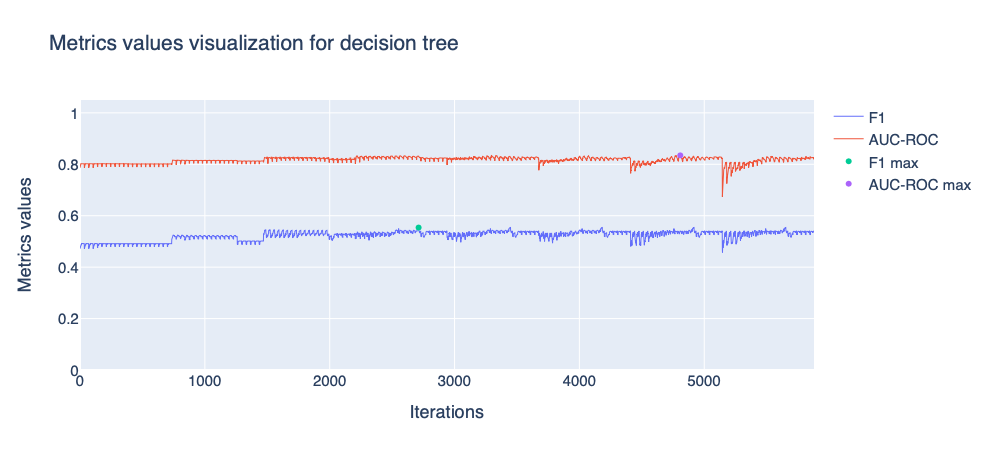

In [103]:
parameters_graph(stats_dt, 'dt')

## Случайный лес

In [91]:
from sklearn.ensemble import RandomForestClassifier

In [93]:
start_time = time.time()

max_f1 = -1

# DataFrame to save stats to visualize them
stats_rf = pd.DataFrame(columns=['f1', 'auc_roc', 'n_estimators', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'overfitted'])

# Model hyperparameters variation
for i in range(50, 126, 25):
    for j in range(4, 12):
        for k in range(2, 103, 10):
            for l in range(1, 21):
                # Model hyperparameters setup
                if j == 11:
                     # Replacement max_depth = 0 with None
                    model_randomforest = RandomForestClassifier(random_state=42, n_estimators=i, max_depth=None, min_samples_split=k, min_samples_leaf=l, n_jobs=-1)
                else:
                    model_randomforest = RandomForestClassifier(random_state=42, n_estimators=i, max_depth=j, min_samples_split=k, min_samples_leaf=l, n_jobs=-1)
                
                # Model training
                model_randomforest.fit(X_train, y_train)
                
                # Model validation
                predict_valid = model_randomforest.predict(X_valid)
                probabilities_valid = model_randomforest.predict_proba(X_valid)
                probabilities_one_valid = probabilities_valid[:, 1]
                
                # Calcation of model F1 and AUC-ROC with the validation sample
                f1 = f1_score(y_valid, predict_valid)
                auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
                
                # Overfitting test
                overfitted = f1 < f1_score(y_train, model_randomforest.predict(X_train)) - 0.1

                # Finding best (by F1) model 
                if f1 > max_f1 and not overfitted:
                    max_f1 = f1

                    if j == 11:
                        corrected_j = None
                    else:
                        corrected_j = j

                    print(
                        'Maximum F1 = {:.4} (AUC-ROC = {:.4}) with n_estimators = {}, max_depth = {}, min_samples_split = {}, min_samples_leaf = {}, time - {:.5} s'
                        .format(max_f1, auc_roc, i, corrected_j, k, l, time.time() - start_time)
                    )
                
                # stats save
                stats_rf = stats_rf.append({'f1': f1, 'auc_roc': auc_roc, 'n_estimators': i, 'max_depth': j, 'min_samples_split': k, 'min_samples_leaf': l, 'overfitted': overfitted}, ignore_index=True)

# max_depth values correction
stats_rf.loc[stats_rf['max_depth'] == 11, 'max_depth'] = 'None'
                
print('Whole best model finding time -', time.time() - start_time)

Maximum F1 = 0.3651 (AUC-ROC = 0.818) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 1, time - 0.21602 s
Maximum F1 = 0.3678 (AUC-ROC = 0.8177) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 2, time - 0.45631 s
Maximum F1 = 0.3685 (AUC-ROC = 0.8201) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 8, time - 1.8589 s
Maximum F1 = 0.3707 (AUC-ROC = 0.8192) with n_estimators = 50, max_depth = 4, min_samples_split = 32, min_samples_leaf = 1, time - 11.843 s
Maximum F1 = 0.3714 (AUC-ROC = 0.8192) with n_estimators = 50, max_depth = 4, min_samples_split = 32, min_samples_leaf = 5, time - 12.613 s
Maximum F1 = 0.4384 (AUC-ROC = 0.8317) with n_estimators = 50, max_depth = 5, min_samples_split = 2, min_samples_leaf = 1, time - 41.793 s
Maximum F1 = 0.4487 (AUC-ROC = 0.8275) with n_estimators = 50, max_depth = 5, min_samples_split = 2, min_samples_leaf = 11, time - 43.748 s
Maximum F1 = 0.4505 (AU

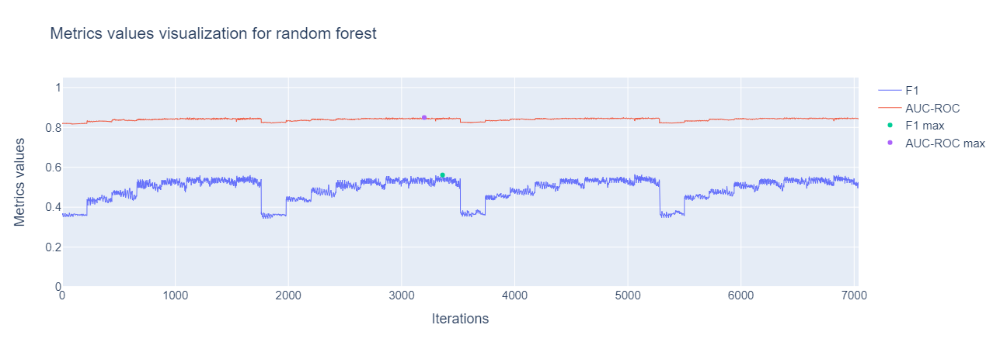

In [104]:
parameters_graph(stats_rf, 'rf')

## Выводы (шаг 2)

На графике распределения клиентов по целевому признаку видно, что выборка имеет ярко выраженный дисбаланс классов - соотношение количества клиентов, у которых не зафиксирован факт ухода и клиентов, у которых факт зафиксирован, примерно равно 4:1.

В ходе исследования были рассмотрены 3 модели, решающие задачу классификации:
- Логистическая регрессия;
- Дерево решений;
- Случайный лес.

Максимальное значение метрики __F1__, равное __0.5613__ (__AUC-ROC__ = 0.8554), было получено с помощью случайного леса при следующих значениях гиперпараметров:
- n_estimators =574;
- max_depth = None;
- min_samples_split = 32;
- min_samples_leaf = 3.

Исходя из визуализации процесса оптимизации гиперпараметров видно, что наиболее значимым гиперпараметров в данном случае является максимальная глубина дерева. Остальные гиперпараметры хоть и влияют на результат, но в значительно меньшей степени.

Лучшее значение __F1__ полученное с помощью дерева решений - 0.554 (__AUC-ROC__ = 0.8325), что является чуть худшим результатом, чем у случайного леса. С помощью логистической регрессии был получен __F1__, равный 0.2929 (__AUC-ROC__ = 0.7518) - видно, что __F1__ значительно отличается от моделей, использующих деревья, а вот отличия в __AUC-ROC__ не столь значительное. 

Из визуализации процессов оптимизации гиперпараметров для дерева решений и случайного леса, а также результатов обучения логистической регрессии можно сделать вывод, что в целом значение __AUC-ROC__ увеличивается вместе с увеличением __F1__, но при маленьких значениях __F1 AUC-ROC__ все равно остается большой и ее изменение не столь в принципе значительно, как у __F1__. Максимальное значение __AUC-ROC__ чаще всего получается с другими значениями гиперпараметров, нежели для __F1__. Хотя, необходимо отметить, что максимальное значение __AUC-ROC__ и значением __AUC-ROC__ с гиперпараметрами, позволяющими достичь максимального значения __F1__, отличаются не значительно. В логистической регрессии же значения __F1__ и __AUC-ROC__ кардинально отличаются, также как и при маленьких значениях глубины деревьев в других моделях. Из этого можно сделать вывод, что для нахождения лучшей модели и ее гиперпараметров необходимо оценивать разные метрики, а не концентрироваться только на одной.

# 3. Борьба с дисбалансом

## Взвешивание классов

### Логистическая регрессия

In [105]:
start_time = time.time()

# Model hyperparameters setup
model_logreg_cw = LogisticRegression(random_state=42, class_weight='balanced')

# Model training
model_logreg_cw.fit(X_train, y_train)

# Model validation
predict_valid = model_logreg_cw.predict(X_valid)
probabilities_valid = model_logreg_cw.predict_proba(X_valid)
probabilities_one_valid = probabilities_valid[:, 1]

# Calcation of model F1 and AUC-ROC with the validation sample
f1 = f1_score(y_valid, predict_valid)
auc_roc = roc_auc_score(y_valid, probabilities_one_valid)

print('F1 = {:.4}, AUC-ROC = {:.4}'.format(f1, auc_roc))

# Overfitting test
if f1 < f1_score(y_train, model_logreg_cw.predict(X_train)) - 0.1:
    print('Model overfitted')

# Variable to save stats to visualize them
stats_lg_cw = [f1, auc_roc]

print("Whole best model finding time - {:.5} s".format(time.time() - start_time))

F1 = 0.4629, AUC-ROC = 0.7526
Whole best model finding time - 0.04196 s


### Дерево решений

In [108]:
start_time = time.time()

max_f1 = -1

# DataFrame to save stats to visualize them
stats_dt_cw = pd.DataFrame(columns=['f1', 'auc_roc', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'overfitted'])

# Model hyperparameters variation
for i in range(4, 12):
    for j in range(2, 203, 10):
        for k in range(1, 36):
            # Model hyperparameters setup
            if i == 11:
                # Replacement max_depth = 0 with None
                model_decisiontree_cw = DecisionTreeClassifier(random_state=42, max_depth=None, min_samples_split=j, min_samples_leaf=k, class_weight='balanced')
            else:
                model_decisiontree_cw = DecisionTreeClassifier(random_state=42, max_depth=i, min_samples_split=j, min_samples_leaf=k, class_weight='balanced')
            
            # Model training
            model_decisiontree_cw.fit(X_train, y_train)
            
            # Model validation
            predict_valid = model_decisiontree_cw.predict(X_valid)
            probabilities_valid = model_decisiontree_cw.predict_proba(X_valid)
            probabilities_one_valid = probabilities_valid[:, 1]
            
            # Calcation of model F1 and AUC-ROC with the validation sample
            f1 = f1_score(y_valid, predict_valid)
            auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
            
            # Overfitting test
            overfitted = f1 < f1_score(y_train, model_decisiontree_cw.predict(X_train)) - 0.1
            
            # Finding best (by F1) model 
            if f1 > max_f1 and not overfitted:
                max_f1 = f1
                
                if i == 11:
                    max_i = None
                else:
                    max_i = i
                
                print(
                    'Maximum F1 = {:.4f} (AUC-ROC = {:.4f}) with max_depth = {}, min_samples_split = {}, min_samples_leaf = {}, time - {:.5} s'
                    .format(max_f1, auc_roc, max_i, j, k, time.time() - start_time)
                )
            
            # Stats save
            stats_dt_cw = stats_dt_cw.append({'f1': f1, 'auc_roc': auc_roc, 'max_depth': i, 'min_samples_split': j, 'min_samples_leaf': k, 'overfitted': overfitted}, ignore_index=True)

# max_depth values correction
stats_dt_cw.loc[stats_dt_cw['max_depth'] == 11, 'max_depth'] = 'None'

print('Whole best model finding time - {:.5} s'.format(time.time() - start_time))

Maximum F1 = 0.5081 (AUC-ROC = 0.7991) with max_depth = 4, min_samples_split = 2, min_samples_leaf = 1, time - 0.049963 s
Maximum F1 = 0.5104 (AUC-ROC = 0.8039) with max_depth = 4, min_samples_split = 2, min_samples_leaf = 2, time - 0.084093 s
Maximum F1 = 0.5167 (AUC-ROC = 0.8060) with max_depth = 5, min_samples_split = 2, min_samples_leaf = 1, time - 20.45 s
Maximum F1 = 0.5189 (AUC-ROC = 0.8105) with max_depth = 5, min_samples_split = 2, min_samples_leaf = 2, time - 20.481 s
Maximum F1 = 0.5234 (AUC-ROC = 0.8195) with max_depth = 5, min_samples_split = 2, min_samples_leaf = 4, time - 20.542 s
Maximum F1 = 0.5261 (AUC-ROC = 0.8224) with max_depth = 5, min_samples_split = 2, min_samples_leaf = 5, time - 20.573 s
Maximum F1 = 0.5289 (AUC-ROC = 0.8193) with max_depth = 6, min_samples_split = 2, min_samples_leaf = 4, time - 43.153 s
Maximum F1 = 0.5294 (AUC-ROC = 0.8219) with max_depth = 6, min_samples_split = 2, min_samples_leaf = 5, time - 43.185 s
Maximum F1 = 0.5298 (AUC-ROC = 0.8239

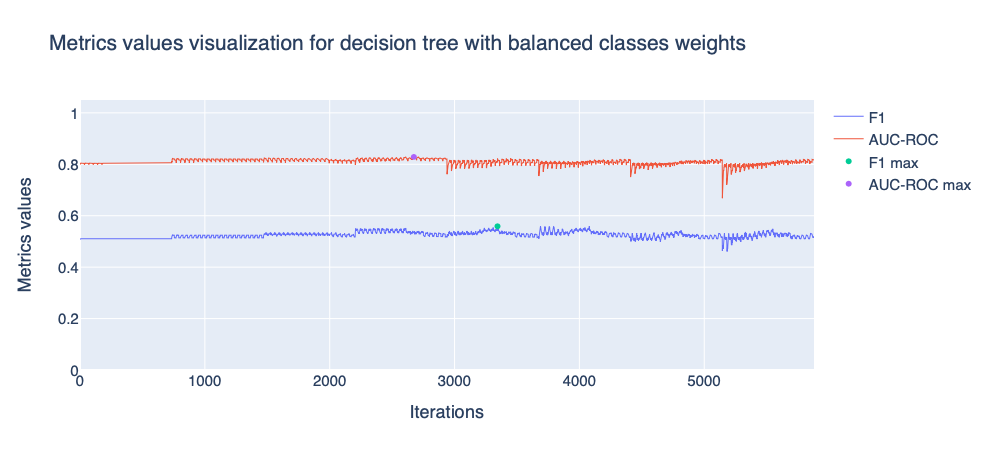

In [109]:
parameters_graph(stats_dt_cw, 'dt', 'with balanced classes weights')

### Случайный лес

In [111]:
start_time = time.time()

max_f1 = -1

# DataFrame to save stats to visualize them
stats_rf_cw = pd.DataFrame(columns=['f1', 'auc_roc', 'n_estimators', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'overfitted'])

# Model hyperparameters variation
for i in range(50, 126, 25):
    for j in range(4, 12):
        for k in range(2, 103, 10):
            for l in range(1, 21):
                # Model hyperparameters setup
                if j == 11:
                    # Replacement max_depth = 0 with None
                    model_randomforest_cw = RandomForestClassifier(random_state=42, n_estimators=i, max_depth=None, min_samples_split=k, min_samples_leaf=l, class_weight='balanced', n_jobs=-1)
                else:
                    model_randomforest_cw = RandomForestClassifier(random_state=42, n_estimators=i, max_depth=j, min_samples_split=k, min_samples_leaf=l, class_weight='balanced', n_jobs=-1)
                
                # Model training
                model_randomforest_cw.fit(X_train, y_train)
                
                # Model validation
                predict_valid = model_randomforest_cw.predict(X_valid)
                probabilities_valid = model_randomforest_cw.predict_proba(X_valid)
                probabilities_one_valid = probabilities_valid[:, 1]
                
                # Calcation of model F1 and AUC-ROC with the validation sample
                f1 = f1_score(y_valid, predict_valid)
                auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
                
                # Overfitting test
                overfitted = f1 < f1_score(y_train, model_randomforest_cw.predict(X_train)) - 0.1

                # Finding best (by F1) model 
                if f1 > max_f1 and not overfitted:
                    max_f1 = f1

                    if j == 11:
                        corrected_j = None
                    else:
                        corrected_j = j

                    print(
                        'Maximum F1 = {:.4} (AUC-ROC = {:.4}) with n_estimators = {}, max_depth = {}, min_samples_split = {}, min_samples_leaf = {}, time - {:.5} s'
                        .format(max_f1, auc_roc, i, corrected_j, k, l, time.time() - start_time)
                    )
                
                # stats save
                stats_rf_cw = stats_rf_cw.append({'f1': f1, 'auc_roc': auc_roc, 'n_estimators': i, 'max_depth': j, 'min_samples_split': k, 'min_samples_leaf': l, 'overfitted': overfitted}, ignore_index=True)

# max_depth values correction
stats_rf_cw.loc[stats_rf_cw['max_depth'] == 11, 'max_depth'] = 'None'
                
print('Whole best model finding time -', time.time() - start_time)

Maximum F1 = 0.534 (AUC-ROC = 0.8142) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 1, time - 0.20777 s
Maximum F1 = 0.535 (AUC-ROC = 0.8141) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 2, time - 0.39752 s
Maximum F1 = 0.5356 (AUC-ROC = 0.8142) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 3, time - 0.62965 s
Maximum F1 = 0.5362 (AUC-ROC = 0.8153) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 5, time - 1.1597 s
Maximum F1 = 0.5373 (AUC-ROC = 0.8149) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 13, time - 2.8375 s
Maximum F1 = 0.542 (AUC-ROC = 0.8155) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 14, time - 3.0237 s
Maximum F1 = 0.5444 (AUC-ROC = 0.8165) with n_estimators = 50, max_depth = 4, min_samples_split = 2, min_samples_leaf = 16, time - 3.4071 s
Maximum F1 = 0.5524 (AUC

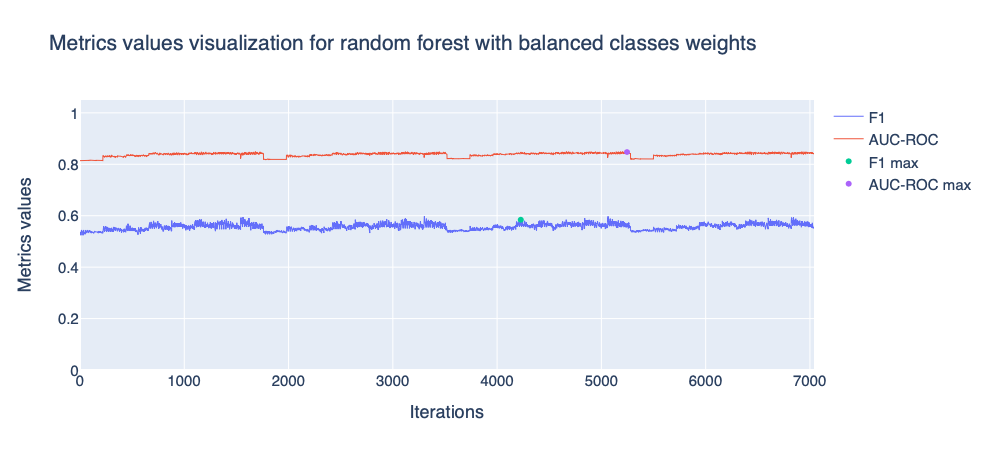

In [113]:
parameters_graph(stats_rf_cw, 'rf', 'with balanced classes weights')

## Upsampling

In [114]:
from sklearn.utils import shuffle

In [115]:
# Funtion for data upsampling
# features - (DataFrame) Features
# target - (Series) Target feature
# repeat - (numeric) Class 1 reps
# returns - (DataFrame, Series) Upsampled deatures and target feature
def upsample(features, target, repeat):
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]

    features_upsampled = pd.concat([features_zeros] + [features_ones] * repeat)
    target_upsampled = pd.concat([target_zeros] + [target_ones] * repeat)
    
    features_upsampled, target_upsampled = shuffle(features_upsampled, target_upsampled, random_state=42)
    
    return features_upsampled, target_upsampled

In [116]:
# Upsampling
X_train_upsampled, y_train_upsampled = upsample(X_train, y_train, 4)

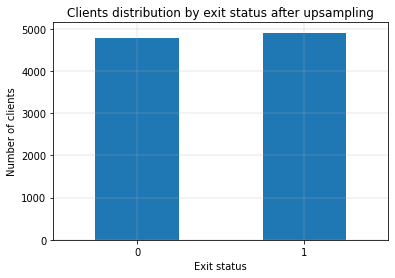

In [117]:
y_train_upsampled.value_counts().sort_index().plot(kind='bar')
plt.xlabel('Exit status')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.3)
plt.title('Clients distribution by exit status after upsampling')
plt.show()

### Логистическая регрессия

In [125]:
start_time = time.time()

# Model hyperparameters setup
model_logreg_up = LogisticRegression(random_state=42)

# Model training
model_logreg_up.fit(X_train_upsampled, y_train_upsampled)

# Model validation
predict_valid = model_logreg_up.predict(X_valid)
probabilities_valid = model_logreg_up.predict_proba(X_valid)
probabilities_one_valid = probabilities_valid[:, 1]

# Calcation of model F1 and AUC-ROC with the validation sample
f1 = f1_score(y_valid, predict_valid)
auc_roc = roc_auc_score(y_valid, probabilities_one_valid)

print('F1 = {:.4}, AUC-ROC = {:.4}'.format(f1, auc_roc))

# Overfitting test
if f1 < f1_score(y_train_upsampled, model_logreg_up.predict(X_train_upsampled)) - 0.1:
    print('Model overfitted')

# Variable to save stats to visualize them
stats_lg_up = [f1, auc_roc]

print("Whole best model finding time - {:.5} s".format(time.time() - start_time))

F1 = 0.4646, AUC-ROC = 0.7525
Model overfitted
Whole best model finding time - 0.091735 s


### Дерево решений

In [131]:
start_time = time.time()

max_f1 = -1

# DataFrame to save stats to visualize them
stats_dt_up = pd.DataFrame(columns=['f1', 'auc_roc', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'overfitted'])

# Model hyperparameters variation
for i in range(4, 12):
    for j in range(2, 203, 10):
        for k in range(1, 36):
            # Model hyperparameters setup
            if i == 11:
                # Replacement max_depth = 0 with None
                model_decisiontree_up = DecisionTreeClassifier(random_state=42, max_depth=None, min_samples_split=j, min_samples_leaf=k)
            else:
                model_decisiontree_up = DecisionTreeClassifier(random_state=42, max_depth=i, min_samples_split=j, min_samples_leaf=k)
            
            # Model training
            model_decisiontree_up.fit(X_train_upsampled, y_train_upsampled)
            
            # Model validation
            predict_valid = model_decisiontree_up.predict(X_valid)
            probabilities_valid = model_decisiontree_up.predict_proba(X_valid)
            probabilities_one_valid = probabilities_valid[:, 1]
            
            # Calcation of model F1 and AUC-ROC with the validation sample
            f1 = f1_score(y_valid, predict_valid)
            auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
            
            # Overfitting test
            overfitted = f1 < f1_score(y_train_upsampled, model_decisiontree_up.predict(X_train_upsampled)) - 0.1
            
            # Finding best (by F1) model 
            if f1 > max_f1 and not overfitted:
                max_f1 = f1b
                
                if i == 11:
                    max_i = None
                else:
                    max_i = i
                
                print(
                    'Maximum F1 = {:.4f} (AUC-ROC = {:.4f}) with max_depth = {}, min_samples_split = {}, min_samples_leaf = {}, time - {:.5} s'
                    .format(max_f1, auc_roc, max_i, j, k, time.time() - start_time)
                )
            
            # Stats save
            stats_dt_up = stats_dt_up.append({'f1': f1, 'auc_roc': auc_roc, 'max_depth': i, 'min_samples_split': j, 'min_samples_leaf': k, 'overfitted': overfitted}, ignore_index=True)

# max_depth values correction
stats_dt_up.loc[stats_dt_up['max_depth'] == 11, 'max_depth'] = 'None'

print('Whole best model finding time - {:.5} s'.format(time.time() - start_time))

Whole best model finding time - 292.73 s


In [132]:
# All models are overfitted
stats_dt_up.query('overfitted == False')

,f1,auc_roc,max_depth,min_samples_split,min_samples_leaf,overfitted


### Случайный лес

In [134]:
start_time = time.time()

max_f1 = -1

# DataFrame to save stats to visualize them
stats_rf_up = pd.DataFrame(columns=['f1', 'auc_roc', 'n_estimators', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'overfitted'])

# Model hyperparameters variation
for i in range(50, 126, 25):
    for j in range(4, 12):
        for k in range(2, 103, 10):
            for l in range(1, 21):
                # Model hyperparameters setup
                if j == 11:
                     # Replacement max_depth = 0 with None
                    model_randomforest_up = RandomForestClassifier(random_state=42, n_estimators=i, max_depth=None, min_samples_split=k, min_samples_leaf=l, n_jobs=-1)
                else:
                    model_randomforest_up = RandomForestClassifier(random_state=42, n_estimators=i, max_depth=j, min_samples_split=k, min_samples_leaf=l, n_jobs=-1)
                
                # Model training
                model_randomforest_up.fit(X_train_upsampled, y_train_upsampled)
                
                # Model validation
                predict_valid = model_randomforest_up.predict(X_valid)
                probabilities_valid = model_randomforest_up.predict_proba(X_valid)
                probabilities_one_valid = probabilities_valid[:, 1]
                
                # Calcation of model F1 and AUC-ROC with the validation sample
                f1 = f1_score(y_valid, predict_valid)
                auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
                
                # Overfitting test
                overfitted = f1 < f1_score(y_train_upsampled, model_randomforest_up.predict(X_train_upsampled)) - 0.1

                # Finding best (by F1) model 
                if f1 > max_f1 and not overfitted:
                    max_f1 = f1

                    if j == 11:
                        corrected_j = None
                    else:
                        corrected_j = j

                    print(
                        'Maximum F1 = {:.4} (AUC-ROC = {:.4}) with n_estimators = {}, max_depth = {}, min_samples_split = {}, min_samples_leaf = {}, time - {:.5} s'
                        .format(max_f1, auc_roc, i, corrected_j, k, l, time.time() - start_time)
                    )
                
                # stats save
                stats_rf_up = stats_rf_up.append({'f1': f1, 'auc_roc': auc_roc, 'n_estimators': i, 'max_depth': j, 'min_samples_split': k, 'min_samples_leaf': l, 'overfitted': overfitted}, ignore_index=True)

# max_depth values correction
stats_rf_up.loc[stats_rf_up['max_depth'] == 11, 'max_depth'] = 'None'
                
print('Whole best model finding time -', time.time() - start_time)

Whole best model finding time - 3545.2596039772034


In [135]:
# All models are overfitted
stats_rf_up.query('overfitted == False')

,f1,auc_roc,n_estimators,max_depth,min_samples_split,min_samples_leaf,overfitted


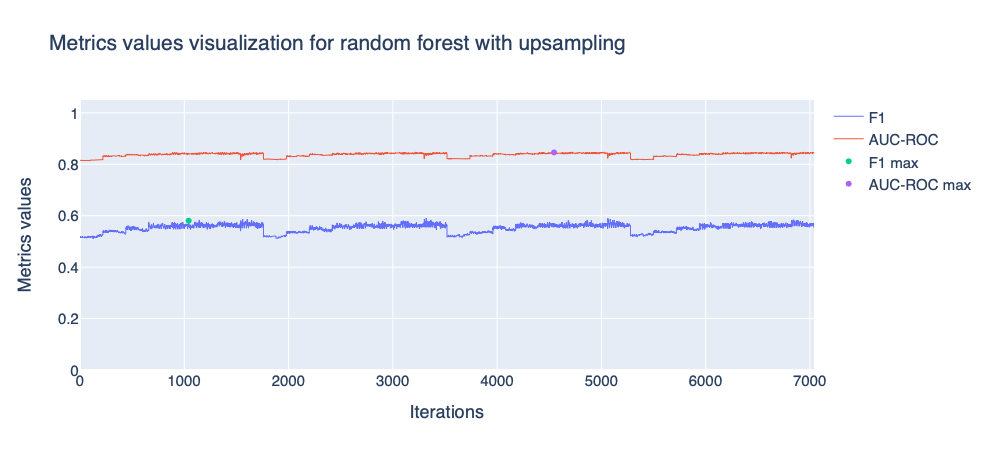

In [122]:
parameters_graph(stats_rf_up, 'rf', 'with upsampling')

## Downsampling

In [136]:
# Funtion for data downsampling
# features - (DataFrame) Features
# target - (Series) Target feature
# fraction - (numeric) Class 0 fraction to use
# returns - (DataFrame, Series) Downsampled features and target feature
def downsample(features, target, fraction):
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]

    features_downsampled = pd.concat(
        [features_zeros.sample(frac=fraction, random_state=42)] + [features_ones])
    target_downsampled = pd.concat(
        [target_zeros.sample(frac=fraction, random_state=42)] + [target_ones])
    
    features_downsampled, target_downsampled = shuffle(features_downsampled, target_downsampled, random_state=42)
    
    return features_downsampled, target_downsampled

In [137]:
# Downsampling
X_train_downsampled, y_train_downsampled = downsample(X_train, y_train, 0.25)

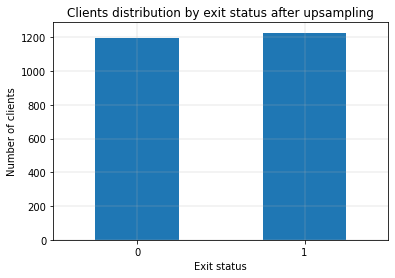

In [138]:
y_train_downsampled.value_counts().sort_index().plot(kind='bar')
plt.xlabel('Exit status')
plt.xticks(rotation=0)
plt.ylabel('Number of clients')
plt.grid(linewidth=0.3)
plt.title('Clients distribution by exit status after upsampling')
plt.show()

### Логистическая регрессия

In [182]:
start_time = time.time()

# Model hyperparameters setup
model_logreg_down = LogisticRegression(random_state=42)

# Model training
model_logreg_down.fit(X_train_downsampled, y_train_downsampled)

# Model validation
predict_valid = model_logreg_down.predict(X_valid)
probabilities_valid = model_logreg_down.predict_proba(X_valid)
probabilities_one_valid = probabilities_valid[:, 1]

# Calcation of model F1 and AUC-ROC with the validation sample
f1 = f1_score(y_valid, predict_valid)
auc_roc = roc_auc_score(y_valid, probabilities_one_valid)

print('F1 = {:.4}, AUC-ROC = {:.4}'.format(f1, auc_roc))

# Overfitting test
if f1 < f1_score(y_train_downsampled, model_logreg_down.predict(X_train_downsampled)) - 0.1:
    print('Model overfitted')

# Variable to save stats to visualize them
stats_lg_down = [f1, auc_roc]

print("Whole best model finding time - {:.5} s".format(time.time() - start_time))

F1 = 0.4639, AUC-ROC = 0.7506
Model overfitted
Whole best model finding time - 0.044679 s


### Дерево решений

In [142]:
start_time = time.time()

max_f1 = -1

# DataFrame to save stats to visualize them
stats_dt_down = pd.DataFrame(columns=['f1', 'auc_roc', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'overfitted'])

# Model hyperparameters variation
for i in range(4, 12):
    for j in range(2, 203, 10):
        for k in range(1, 36):
            # Model hyperparameters setup
            if i == 11:
                # Replacement max_depth = 0 with None
                model_decisiontree_down = DecisionTreeClassifier(random_state=42, max_depth=None, min_samples_split=j, min_samples_leaf=k)
            else:
                model_decisiontree_down = DecisionTreeClassifier(random_state=42, max_depth=i, min_samples_split=j, min_samples_leaf=k)
            
            # Model training
            model_decisiontree_down.fit(X_train_downsampled, y_train_downsampled)
            
            # Model validation
            predict_valid = model_decisiontree_down.predict(X_valid)
            probabilities_valid = model_decisiontree_down.predict_proba(X_valid)
            probabilities_one_valid = probabilities_valid[:, 1]
            
            # Calcation of model F1 and AUC-ROC with the validation sample
            f1 = f1_score(y_valid, predict_valid)
            auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
            
            # Overfitting test
            overfitted = f1 < f1_score(y_train_downsampled, model_decisiontree_up.predict(X_train_downsampled)) - 0.1
            
            # Finding best (by F1) model 
            if f1 > max_f1 and not overfitted:
                max_f1 = f1b
                
                if i == 11:
                    max_i = None
                else:
                    max_i = i
                
                print(
                    'Maximum F1 = {:.4f} (AUC-ROC = {:.4f}) with max_depth = {}, min_samples_split = {}, min_samples_leaf = {}, time - {:.5} s'
                    .format(max_f1, auc_roc, max_i, j, k, time.time() - start_time)
                )
            
            # Stats save
            stats_dt_down = stats_dt_down.append({'f1': f1, 'auc_roc': auc_roc, 'max_depth': i, 'min_samples_split': j, 'min_samples_leaf': k, 'overfitted': overfitted}, ignore_index=True)

# max_depth values correction
stats_dt_down.loc[stats_dt_down['max_depth'] == 11, 'max_depth'] = 'None'

print('Whole best model finding time - {:.5} s'.format(time.time() - start_time))

Whole best model finding time - 124.43 s


In [143]:
# All models are overfitted
stats_dt_down.query('overfitted == False')

,f1,auc_roc,max_depth,min_samples_split,min_samples_leaf,overfitted


### Случайный лес

In [144]:
start_time = time.time()

max_f1 = -1

# DataFrame to save stats to visualize them
stats_rf_down = pd.DataFrame(columns=['f1', 'auc_roc', 'n_estimators', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'overfitted'])

# Model hyperparameters variation
for i in range(50, 126, 25):
    for j in range(4, 12):
        for k in range(2, 103, 10):
            for l in range(1, 21):
                # Model hyperparameters setup
                if j == 11:
                     # Replacement max_depth = 0 with None
                    model_randomforest_down = RandomForestClassifier(random_state=42, n_estimators=i, max_depth=None, min_samples_split=k, min_samples_leaf=l, n_jobs=-1)
                else:
                    model_randomforest_down = RandomForestClassifier(random_state=42, n_estimators=i, max_depth=j, min_samples_split=k, min_samples_leaf=l, n_jobs=-1)
                
                # Model training
                model_randomforest_down.fit(X_train_downsampled, y_train_downsampled)
                
                # Model validation
                predict_valid = model_randomforest_down.predict(X_valid)
                probabilities_valid = model_randomforest_down.predict_proba(X_valid)
                probabilities_one_valid = probabilities_valid[:, 1]
                
                # Calcation of model F1 and AUC-ROC with the validation sample
                f1 = f1_score(y_valid, predict_valid)
                auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
                
                # Overfitting test
                overfitted = f1 < f1_score(y_train_downsampled, model_randomforest_up.predict(X_train_downsampled)) - 0.1

                # Finding best (by F1) model 
                if f1 > max_f1 and not overfitted:
                    max_f1 = f1

                    if j == 11:
                        corrected_j = None
                    else:
                        corrected_j = j

                    print(
                        'Maximum F1 = {:.4} (AUC-ROC = {:.4}) with n_estimators = {}, max_depth = {}, min_samples_split = {}, min_samples_leaf = {}, time - {:.5} s'
                        .format(max_f1, auc_roc, i, corrected_j, k, l, time.time() - start_time)
                    )
                
                # stats save
                stats_rf_down = stats_rf_down.append({'f1': f1, 'auc_roc': auc_roc, 'n_estimators': i, 'max_depth': j, 'min_samples_split': k, 'min_samples_leaf': l, 'overfitted': overfitted}, ignore_index=True)

# max_depth values correction
stats_rf_down.loc[stats_rf_down['max_depth'] == 11, 'max_depth'] = 'None'
                
print('Whole best model finding time -', time.time() - start_time)

Whole best model finding time - 2157.641093015671


In [145]:
# All models are overfitted
stats_rf_down.query('overfitted == False')

,f1,auc_roc,n_estimators,max_depth,min_samples_split,min_samples_leaf,overfitted


## Сравнение моделей

In [146]:
import seaborn as sns

In [147]:
# DataFrame to store score for models comparison
best_scores = pd.DataFrame(columns=['model', 'type', 'f1', 'auc_roc'])

In [148]:
# Addition of logistic regression scores
best_scores = best_scores.append([
    {'model': 'Logistic Regression', 'type': 'Plain', 'f1': stats_lg[0], 'auc_roc': stats_lg[1]},
    {'model': 'Logistic Regression', 'type': 'Balanced', 'f1': stats_lg_cw[0], 'auc_roc': stats_lg_cw[1]},
    {'model': 'Logistic Regression', 'type': 'Upsampled (overfitted)', 'f1': stats_lg_up[0], 'auc_roc': stats_lg_up[1]},
    {'model': 'Logistic Regression', 'type': 'Downsampled (overfitted)', 'f1': stats_lg_down[0], 'auc_roc': stats_lg_down[1]}
], ignore_index=True)

In [149]:
# Addition of decision tree scores
best_scores = best_scores.append([
    {'model': 'Decision Tree', 'type': 'Plain', 'f1': stats_dt.query('overfitted == False')['f1'].max(), 'auc_roc': stats_dt.query('overfitted == False')['auc_roc'].max()},
    {'model': 'Decision Tree', 'type': 'Balanced', 'f1': stats_dt_cw.query('overfitted == False')['f1'].max(), 'auc_roc': stats_dt_cw.query('overfitted == False')['auc_roc'].max()},
    {'model': 'Decision Tree', 'type': 'Upsampled (overfitted)', 'f1': stats_dt_up['f1'].max(), 'auc_roc': stats_dt_up['auc_roc'].max()},
    {'model': 'Decision Tree', 'type': 'Downsampled (overfitted)', 'f1': stats_dt_down['f1'].max(), 'auc_roc': stats_dt_down['auc_roc'].max()}
], ignore_index=True)

In [150]:
# Addition of random forest scores
best_scores = best_scores.append([
    {'model': 'Random Forest', 'type': 'Plain', 'f1': stats_rf.query('overfitted == False')['f1'].max(), 'auc_roc': stats_rf.query('overfitted == False')['auc_roc'].max()},
    {'model': 'Random Forest', 'type': 'Balanced', 'f1': stats_rf_cw.query('overfitted == False')['f1'].max(), 'auc_roc': stats_rf_cw.query('overfitted == False')['auc_roc'].max()},
    {'model': 'Random Forest', 'type': 'Upsampled (overfitted)', 'f1': stats_rf_up['f1'].max(), 'auc_roc': stats_rf_up['auc_roc'].max()},
    {'model': 'Random Forest', 'type': 'Downsampled (overfitted)', 'f1': stats_rf_down['f1'].max(), 'auc_roc': stats_rf_down['auc_roc'].max()}
], ignore_index=True)

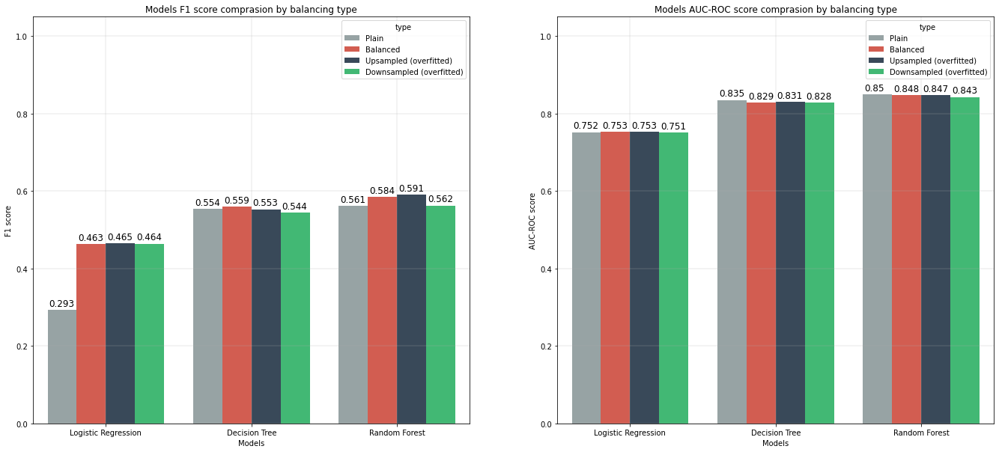

In [151]:
fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2,
    figsize=(23, 10)
)

sns.barplot(x='model', y='f1', hue='type', data=best_scores, palette=sns.color_palette(["#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]), ax=ax1)
sns.barplot(x='model', y='auc_roc', hue='type', data=best_scores, palette=sns.color_palette(["#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]), ax=ax2)

ax1.set_xlabel('Models')
ax1.set_ylabel('F1 score')
ax1.grid(linewidth=0.3)
ax1.set_title('Models F1 score comprasion by balancing type')
ax1.set_ylim(0, 1.05)

modifications = (-0.3, -0.1, 0.1, 0.3)

for i in range(3):
    for j in range(4):
        ax1.text(i + modifications[j] - 0.09,
                 best_scores.loc[(i * 4) + j, 'f1'] + 0.01,
                 round(best_scores.loc[(i * 4) + j, 'f1'], 3),
                 fontsize=12)

ax2.set_xlabel('Models')
ax2.set_ylabel('AUC-ROC score')
ax2.grid(linewidth=0.3)
ax2.set_title('Models AUC-ROC score comprasion by balancing type')
ax2.set_ylim(0, 1.05)

for i in range(3):
    for j in range(4):
        ax2.text(i + modifications[j] - 0.09,
                 best_scores.loc[(i * 4) + j, 'auc_roc'] + 0.01,
                 round(best_scores.loc[(i * 4) + j, 'auc_roc'], 3),
                 fontsize=12)

plt.show()

## Изменение порога

In [195]:
# Best model hyperparameters setup
best_model = RandomForestClassifier(random_state=42, max_depth = 7, min_samples_split = 22, min_samples_leaf = 8, class_weight='balanced', n_jobs=-1)

In [196]:
# Threshold change test
best_model.fit(X_train, y_train)

probabilities_valid = best_model.predict_proba(X_valid)
probabilities_one_valid = probabilities_valid[:, 1]

probabilities_train = best_model.predict_proba(X_train)
probabilities_one_train = probabilities_train[:, 1]

max_f1 = -1

for threshold in np.arange(0, 1, 0.001):
    predicted_valid = probabilities_one_valid > threshold
    predicted_train = probabilities_one_train > threshold
    
    f1 = f1_score(y_valid, predicted_valid)
                
    # Overfitting test
    overfitted = f1 < f1_score(y_train, predicted_train) - 0.1
    
    if f1 >= max_f1 and not overfitted:
        max_f1 = f1
        best_threshold = threshold
        
print("Threshold = {:.3f} | F1 = {:.4f}".format(best_threshold, max_f1))

Threshold = 0.503 | F1 = 0.5847


## Выводы (шаг 3)

Все используемые ранее модели были переобучены с учетом дисбаланса классов. Балансировка классов была проведена 3-мя способами:
- Взвешивание классов;
- Увеличение выборки (upsampling);
- Уменьшение выборки (downsampling).

После чего было проведено сравнение результатов и выбор лучшей модели (на основе метрики F1):
- уменьшение и увеличение выборки хоть и дает некие результаты, но все модели, обученные на данных с этими типами балансировки, получились очень переобученными - разница между F1 для тестовой и валидационной выборок составил более чем 0.1. Поэтому в данном случае имеет смысл использовать только взвешивание классов;
- для логистической регрессии балансировка дала лучший результат - значение F1 увеличилось с 0.293 до 0.463 при использовании взвешивания классов;
- для дерева решений балансировка практически не дела результатов - прирост F1 составил 0.005;
- для случайного леса балансировка дала несколько более значимый прирост F1, чем у дерева решений, но все равно сравнительно небольшой - F1 увеличилась на 0.023;
- на AUC-ROC балансировка практически не влияет. Все выводы по AUC-ROC, сделанные в разделе №2, можно отнести к результатам после балансировки классов.

К лучшей модели был применен метод изменения порога при определении классов. Он дал незначительные результаты и увеличил F1 на 0.0004.

В результате лучший результат (по F1) показал случайный лес с взвешиванием классов - __F1__ = __0.5847__, __AUC-ROC__ = __0.8458__.

# 4. Тестирование модели

In [197]:
# Best model training
best_model.fit(X_train.append(X_valid), y_train.append(y_valid))

RandomForestClassifier(class_weight='balanced', max_depth=7, min_samples_leaf=8,
                       min_samples_split=22, n_jobs=-1, random_state=42)

In [198]:
# Model test
probabilities_test = best_model.predict_proba(X_test)
probabilities_one_test = probabilities_test[:, 1]
predict_test = probabilities_one_test > 0.503

print('Best model F1 = {:.4}, AUC-ROC = {:.4}'.format(f1_score(y_test, predict_test), roc_auc_score(y_test, probabilities_one_test)))

Best model F1 = 0.6298, AUC-ROC = 0.8663


In [199]:
# Overfitting test
probabilities_test_overfitting = best_model.predict_proba(X_train.append(X_valid))
probabilities_one_test_overfitting = probabilities_test_overfitting[:, 1]
predict_test_overfitting = probabilities_one_test_overfitting > 0.503

print('Best model F1 = {:.4}, AUC-ROC = {:.4} on train data'.format(f1_score(y_train.append(y_valid), predict_test_overfitting), roc_auc_score(y_train.append(y_valid), probabilities_one_test_overfitting)))

Best model F1 = 0.646, AUC-ROC = 0.8916 on train data


## Выводы (шаг 4)

Лучшей моделью стал случайный лес со следующими параметрами:
- n_estimators = 100 (стандартное значение);
- max_depth = 7;
- min_samples_split = 22;
- min_samples_leaf = 8.

Данная модель была обучена на выборке, объединенной из обучающей и валидационной выборок для улучшения ее показателей за счет максимизации обучающей выборки. После этого были рассчитаны __F1__ и __AUC-ROC__ для тестовой выборки, которые составили __0.6298__ и __0.8663__, соотвественно, что является достаточным результатом для выполнения данной работы, но я бы не назвал данный результат достаточным для реального применения данной модели. Если значение AUC-ROC можно назвать приемлимым (но никак не хорошим), то значение F1 очень далеко до хорошей модели. Также у этой модели наблюдается незначительная степень переобучения - F1 и AUC-ROC для обучающей выборки составляют 0.646 и 0.8916, соответственно.

# Чек-лист готовности проекта

Поставьте 'x' в выполненных пунктах. Далее нажмите Shift+Enter.

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Выполнен шаг 1: данные подготовлены
- [x]  Выполнен шаг 2: задача исследована
    - [x]  Исследован баланс классов
    - [x]  Изучены модели без учёта дисбаланса
    - [x]  Написаны выводы по результатам исследования
- [x]  Выполнен шаг 3: учтён дисбаланс
    - [x]  Применено несколько способов борьбы с дисбалансом
    - [x]  Написаны выводы по результатам исследования
- [x]  Выполнен шаг 4: проведено тестирование
- [x]  Удалось достичь *F1*-меры не менее 0.59
- [x]  Исследована метрика *AUC-ROC*